# 얼굴 비교 및 SSIM 계산

이 노트북은 두 이미지에서 얼굴을 추출하고 SSIM(Structural Similarity Index)을 계산합니다.

## 1. 이미지 업로드 및 얼굴 추출

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.font_manager as fm

print("🔄 YOLOv8 Anime Face Detector 초기화 중...")

# 한글 폰트 설정 (개선된 버전)
try:
    # 우선순위가 높은 폰트부터 찾기
    priority_fonts = ['Malgun Gothic', 'NanumGothic', 'NanumBarunGothic', 'Gulim', 'Dotum']
    
    font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
    selected_font = None
    
    # 우선순위 폰트 찾기
    for font_name in priority_fonts:
        matching_fonts = [f for f in font_list if font_name.lower() in f.lower()]
        if matching_fonts:
            font_prop = fm.FontProperties(fname=matching_fonts[0])
            plt.rcParams['font.family'] = font_prop.get_name()
            selected_font = font_prop.get_name()
            break
    
    if selected_font:
        print(f"✓ 한글 폰트 설정 완료: {selected_font}")
    else:
        plt.rcParams['font.family'] = 'DejaVu Sans'
        print("! 한글 폰트를 찾을 수 없어 영문 제목으로 표시됩니다.")
except Exception as e:
    plt.rcParams['font.family'] = 'DejaVu Sans'
    print(f"! 한글 폰트 설정 실패: {e}")

plt.rcParams['axes.unicode_minus'] = False

# YOLOv8 모델 로드 (lazy loading)
yolo_model = None

def load_yolo_model():
    """YOLOv8 모델을 처음 사용할 때만 로드"""
    global yolo_model
    if yolo_model is None:
        try:
            from ultralytics import YOLO
            print("🔄 YOLOv8 모델 로딩 중...")
            # 로컬 모델 파일 사용
            yolo_model = YOLO('c:/Users/MINO/Desktop/ssim_project/yolov8x6_animeface.pt')
            print("✓ YOLOv8 애니메이션 얼굴 검출기 로드 완료!")
        except Exception as e:
            print(f"✗ YOLOv8 모델 로드 실패: {e}")
            import traceback
            traceback.print_exc()
            raise
    return yolo_model

# 전역 변수
face_images = []
original_images = []

def detect_anime_faces_yolo(img_rgb, conf_threshold=0.25, margin_percent=0.0):
    """
    YOLOv8 기반 애니메이션 얼굴 검출
    
    Args:
        img_rgb: RGB 이미지
        conf_threshold: 신뢰도 임계값
        margin_percent: 얼굴 박스 확장 비율 (0.0 = 확장 없음, 0.1 = 10% 확장)
    """
    model = load_yolo_model()
    
    try:
        # YOLOv8 추론
        results = model.predict(img_rgb, conf=conf_threshold, imgsz=1280, verbose=False)
        
        if len(results) == 0 or results[0].boxes is None or len(results[0].boxes) == 0:
            return []
        
        result = []
        boxes = results[0].boxes
        
        for i in range(len(boxes)):
            conf = float(boxes.conf[i])
            if conf < conf_threshold:
                continue
            
            # xyxy 형식 (x1, y1, x2, y2)
            x1, y1, x2, y2 = map(int, boxes.xyxy[i])
            w, h = x2 - x1, y2 - y1
            
            # margin 추가 (기본값 0% = 확장 없음)
            img_h, img_w = img_rgb.shape[:2]
            margin_x = int(w * margin_percent)
            margin_y = int(h * margin_percent)
            
            x1 = max(0, x1 - margin_x)
            y1 = max(0, y1 - margin_y)
            x2 = min(img_w, x2 + margin_x)
            y2 = min(img_h, y2 + margin_y)
            
            result.append({
                'box': (x1, y1, x2 - x1, y2 - y1),
                'confidence': conf
            })
        
        return result
    
    except Exception as e:
        print(f"✗ YOLOv8 검출 중 오류: {e}")
        import traceback
        traceback.print_exc()
        raise

def process_images(image_path1, image_path2, conf_threshold=0.25, margin_percent=0.0):
    """
    두 이미지를 처리하여 얼굴을 추출하는 함수 (YOLOv8 전용)
    
    Args:
        image_path1: 첫 번째 이미지 경로
        image_path2: 두 번째 이미지 경로
        conf_threshold: YOLOv8 신뢰도 임계값 (기본값: 0.25)
        margin_percent: 얼굴 박스 확장 비율 (기본값: 0.0 = 확장 없음)
    """
    global face_images, original_images
    
    face_images = []
    original_images = []
    
    print("=" * 50)
    print("이미지 처리 시작 (YOLOv8 Anime Face Detector)")
    print("=" * 50)
    
    for idx, img_path in enumerate([image_path1, image_path2]):
        try:
            print(f"\n이미지 {idx + 1} 처리 시작: {img_path}")
            
            # 이미지 읽기
            img = cv2.imread(img_path)
            if img is None:
                print(f"✗ 이미지를 읽을 수 없습니다: {img_path}")
                continue
                
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            print(f"이미지 {idx + 1} YOLOv8 얼굴 검출 중...")
            
            # YOLOv8 얼굴 검출
            faces = detect_anime_faces_yolo(img_rgb, conf_threshold=conf_threshold, margin_percent=margin_percent)
            
            if not faces:
                print(f"✗ 이미지 {idx + 1}에서 얼굴을 찾을 수 없습니다.")
                print(f"  (신뢰도 임계값: {conf_threshold})")
                continue
            
            # 가장 큰 얼굴 선택
            best_face = max(faces, key=lambda f: f['box'][2] * f['box'][3])
            
            x, y, w, h = best_face['box']
            conf = best_face['confidence']
            
            # 얼굴 영역 크롭
            face_crop = img_rgb[y:y+h, x:x+w]
            
            face_images.append(face_crop)
            original_images.append(img_rgb)
            
            print(f"✓ 이미지 {idx + 1} 얼굴 검출 완료 (총 {len(faces)}개 검출)")
            print(f"  - 선택된 얼굴 위치: ({x}, {y})")
            print(f"  - 크기: {w}x{h}")
            print(f"  - 신뢰도: {conf:.3f}")
            print(f"  - Margin: {margin_percent*100:.0f}%")
            
        except Exception as e:
            print(f"✗ 이미지 {idx + 1} 처리 중 오류: {str(e)}")
            import traceback
            traceback.print_exc()
    
    print("=" * 50)
    
    # 결과 표시
    if len(face_images) == 2:
        print(f"\n✓ 두 이미지에서 얼굴을 성공적으로 추출했습니다!")
        
        fig, axes = plt.subplots(2, 2, figsize=(12, 10))
        
        for i in range(2):
            # 원본 이미지
            axes[i, 0].imshow(original_images[i])
            axes[i, 0].set_title(f'Original Image {i+1}')
            axes[i, 0].axis('off')
            
            # 추출된 얼굴
            axes[i, 1].imshow(face_images[i])
            axes[i, 1].set_title(f'Extracted Face {i+1}')
            axes[i, 1].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        return True
    else:
        print("\n✗ 일부 이미지에서 얼굴을 찾을 수 없습니다.")
        return False

# 사용 예시
print("\n" + "=" * 50)
print("사용 방법:")
print("=" * 50)
print("기본 사용 (margin 0%, 타이트하게):")
print("  process_images('image1.jpg', 'image2.jpg')")
print("")
print("Margin 추가 (배경 포함):")
print("  process_images('image1.jpg', 'image2.jpg', margin_percent=0.05)  # 5% 확장")
print("")
print("신뢰도 임계값 조정:")
print("  process_images('image1.jpg', 'image2.jpg', conf_threshold=0.3)")
print("=" * 50)
print("\n💡 참고:")
print("  - margin_percent=0.0: 얼굴만 정확히 크롭 (기본값)")
print("  - margin_percent=0.1: 얼굴 주변 10% 포함 (이전 방식)")
print("=" * 50)

# 자동 실행 (YOLOv8 사용, margin 0%)
process_images('images/moondoors_onesomeshot_api_cloud_56c3d545_20251108_233648_2504324.png', 
               'images/moondoors_onesomeshot_api_cloud_af3f7064_20251108_233613_2504324.png',
               margin_percent=0.0)

## 2. SSIM 계산


ERS-SSIM 계산 (수정된 공식)
1. Existence Term (l):   1.0000
   - Face 1 landmarks:   ✓ 검출됨
   - Face 2 landmarks:   ✓ 검출됨
2. Relative Geometry (c): 0.9962
   - Ratio difference:   0.0943
3. Structural Term (s):   0.6343
   - Face Feature Edge SSIM: 0.6343
   - (C3 제거, Edge SSIM 직접 사용)
최종 ERS-SSIM: 0.6318


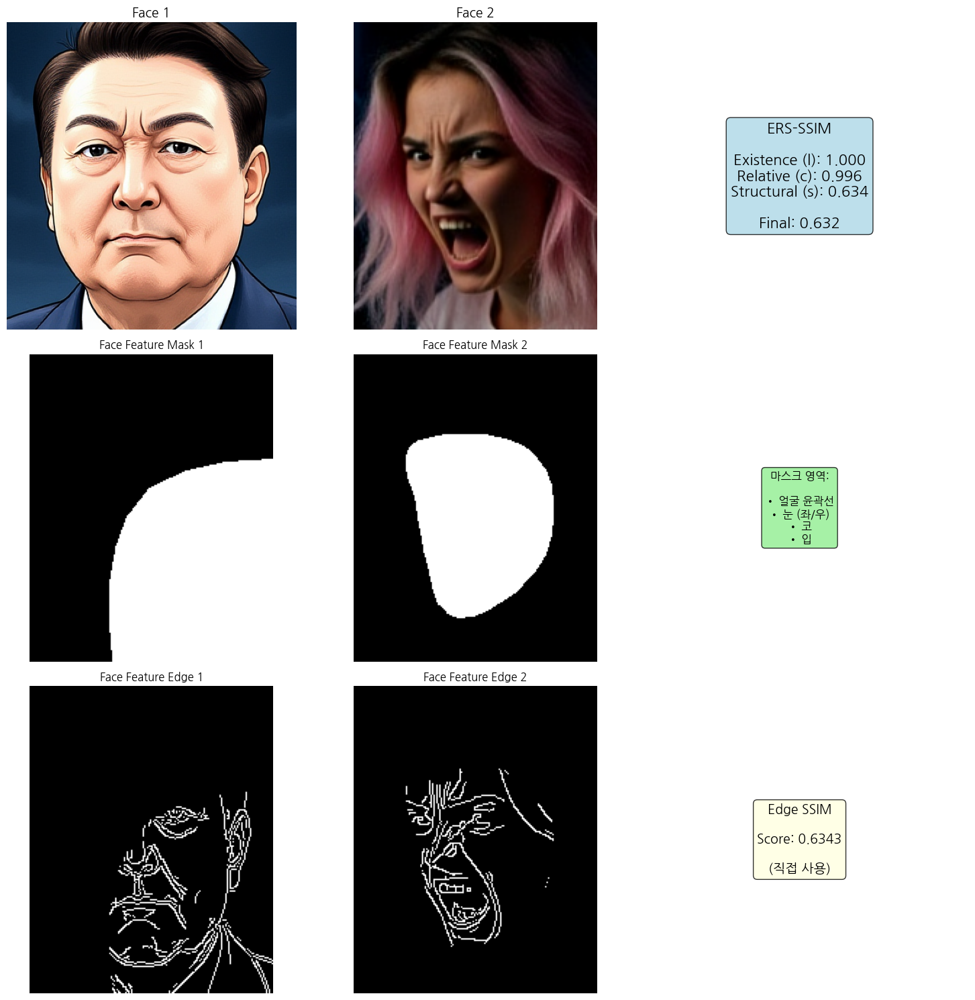


=== ERS-SSIM 분석 결과 ===
Existence Term:    1.0000 (E1=1.0, E2=1.0)
Relative Geometry: 0.9962
Structural Term:   0.6343 (Edge SSIM 직접 사용)

최종 ERS-SSIM:     0.6318

🙂 유사한 얼굴입니다.


In [68]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
from skimage.metrics import structural_similarity as ssim

# MediaPipe Face Mesh 초기화 (파라미터 최대 완화)
mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh(
    static_image_mode=True,
    max_num_faces=1,
    min_detection_confidence=0.1,  # 0.3 → 0.1로 낮춤 (애니메이션 얼굴 검출 향상)
    min_tracking_confidence=0.1
)

# ============================================================
# 이미지 전처리 (검출률 향상)
# ============================================================

def preprocess_for_landmarks(face_rgb):
    """MediaPipe 검출률 향상을 위한 전처리 (리사이즈 + CLAHE)"""
    h, w = face_rgb.shape[:2]
    target_size = 512
    
    if h < target_size or w < target_size:
        scale = target_size / min(h, w)
        new_w = int(w * scale)
        new_h = int(h * scale)
        face_rgb = cv2.resize(face_rgb, (new_w, new_h), interpolation=cv2.INTER_CUBIC)
    
    lab = cv2.cvtColor(face_rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    l_clahe = clahe.apply(l)
    
    lab_clahe = cv2.merge([l_clahe, a, b])
    enhanced = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2RGB)
    
    return enhanced

# ============================================================
# ERS-SSIM: Existence-Relative-Structural SSIM
# ============================================================

def detect_landmarks(face_rgb):
    """MediaPipe로 얼굴 랜드마크 검출 (전처리 포함)"""
    enhanced = preprocess_for_landmarks(face_rgb)
    results = face_mesh.process(enhanced)
    
    if not results.multi_face_landmarks:
        return None
    
    landmarks = results.multi_face_landmarks[0]
    h, w = face_rgb.shape[:2]
    
    points = []
    for lm in landmarks.landmark:
        x = int(lm.x * w)
        y = int(lm.y * h)
        points.append((x, y))
    
    return points

def create_face_feature_mask(img_shape, landmarks):
    """얼굴 특징 영역 마스크 생성 (윤곽선, 눈, 코, 입)"""
    h, w = img_shape[:2]
    mask = np.zeros((h, w), dtype=np.uint8)
    
    if landmarks is None:
        return mask
    
    # MediaPipe 468-point 랜드마크 인덱스
    face_oval = [10, 338, 297, 332, 284, 251, 389, 356, 454, 323, 361, 288,
                 397, 365, 379, 378, 400, 377, 152, 148, 176, 149, 150, 136,
                 172, 58, 132, 93, 234, 127, 162, 21, 54, 103, 67, 109]
    
    left_eye = [33, 7, 163, 144, 145, 153, 154, 155, 133, 173, 157, 158, 159, 160, 161, 246]
    right_eye = [362, 382, 381, 380, 374, 373, 390, 249, 263, 466, 388, 387, 386, 385, 384, 398]
    nose = [1, 2, 98, 327, 326, 2, 97, 99]
    lips = [61, 146, 91, 181, 84, 17, 314, 405, 321, 375, 291, 409, 270, 269, 267, 0, 37, 39, 40, 185]
    
    def draw_feature(indices, thickness=2):
        if len(indices) > 0:
            pts = np.array([landmarks[i] for i in indices if i < len(landmarks)], dtype=np.int32)
            cv2.polylines(mask, [pts], isClosed=True, color=255, thickness=thickness)
            cv2.fillPoly(mask, [pts], color=255)
    
    draw_feature(face_oval, thickness=3)
    draw_feature(left_eye, thickness=2)
    draw_feature(right_eye, thickness=2)
    draw_feature(nose, thickness=2)
    draw_feature(lips, thickness=2)
    
    return mask

def existence_term(landmarks1, landmarks2):
    """
    Existence Term (E): 랜드마크 존재 여부 비교
    Formula: l = (2*E1*E2 + C1) / (E1^2 + E2^2 + C1)
    C1 = 1e-6 (stability constant)
    """
    C1 = 1e-6
    E1 = 1.0 if landmarks1 is not None else 0.0
    E2 = 1.0 if landmarks2 is not None else 0.0
    
    l = (2 * E1 * E2 + C1) / (E1**2 + E2**2 + C1)
    
    return l, E1, E2

def relative_geometry_term(landmarks1, landmarks2):
    """
    Relative Geometry Term (R): 비율 기반 기하학
    Formula: c = (2*(1-R) + C2) / ((1-R)^2 + 1.0 + C2)
    C2 = 0.5 (stability constant)
    """
    C2 = 0.5
    
    if landmarks1 is None or landmarks2 is None:
        return 0.0, 0.0, 0.0
    
    def calculate_ratios(landmarks):
        left_eye_idx = 33
        right_eye_idx = 263
        nose_idx = 1
        mouth_idx = 13
        
        left_eye = np.array(landmarks[left_eye_idx])
        right_eye = np.array(landmarks[right_eye_idx])
        nose = np.array(landmarks[nose_idx])
        mouth = np.array(landmarks[mouth_idx])
        
        d_eyes = np.linalg.norm(left_eye - right_eye)
        d_eye_nose = np.linalg.norm((left_eye + right_eye) / 2 - nose)
        d_nose_mouth = np.linalg.norm(nose - mouth)
        
        if d_eyes < 1e-6:
            return 0.0, 0.0
        
        ratio1 = d_eye_nose / d_eyes
        ratio2 = d_nose_mouth / d_eyes
        
        return ratio1, ratio2
    
    r1_1, r1_2 = calculate_ratios(landmarks1)
    r2_1, r2_2 = calculate_ratios(landmarks2)
    
    diff1 = abs(r1_1 - r2_1)
    diff2 = abs(r1_2 - r2_2)
    R = (diff1 + diff2) / 2.0
    
    c = (2 * (1 - R) + C2) / ((1 - R)**2 + 1.0 + C2)
    
    return c, R, diff1

def structural_term(face1, face2, landmarks1, landmarks2):
    """
    Structural Term (S): 얼굴 특징 영역 엣지 기반 구조 비교
    Formula: s = Edge_SSIM (직접 사용, C3 제거)
    """
    g1 = cv2.cvtColor(face1, cv2.COLOR_RGB2GRAY)
    g2 = cv2.cvtColor(face2, cv2.COLOR_RGB2GRAY)
    
    h = min(g1.shape[0], g2.shape[0])
    w = min(g1.shape[1], g2.shape[1])
    g1_resized = cv2.resize(g1, (w, h))
    g2_resized = cv2.resize(g2, (w, h))
    
    mask1 = create_face_feature_mask((h, w), landmarks1)
    mask2 = create_face_feature_mask((h, w), landmarks2)
    
    if landmarks1 is not None:
        mask1 = cv2.resize(mask1, (w, h))
    if landmarks2 is not None:
        mask2 = cv2.resize(mask2, (w, h))
    
    edge1 = cv2.Canny(g1_resized, 80, 150)
    edge2 = cv2.Canny(g2_resized, 80, 150)
    
    edge1_masked = cv2.bitwise_and(edge1, edge1, mask=mask1)
    edge2_masked = cv2.bitwise_and(edge2, edge2, mask=mask2)
    
    # Edge SSIM을 직접 사용 (C3 제거)
    S = ssim(edge1_masked, edge2_masked, data_range=255)
    s = S  # 직접 사용
    
    return s, S, edge1_masked, edge2_masked, mask1, mask2

def ers_ssim(face1, face2):
    """
    ERS-SSIM: Existence-Relative-Structural SSIM
    Final score: SSIM = l * c * s
    """
    print("\n" + "=" * 50)
    print("ERS-SSIM 계산 (수정된 공식)")
    print("=" * 50)
    
    landmarks1 = detect_landmarks(face1)
    landmarks2 = detect_landmarks(face2)
    
    l, E1, E2 = existence_term(landmarks1, landmarks2)
    print(f"1. Existence Term (l):   {l:.4f}")
    print(f"   - Face 1 landmarks:   {'✓ 검출됨' if E1 > 0 else '✗ 미검출'}")
    print(f"   - Face 2 landmarks:   {'✓ 검출됨' if E2 > 0 else '✗ 미검출'}")
    
    c, R, diff = relative_geometry_term(landmarks1, landmarks2)
    print(f"2. Relative Geometry (c): {c:.4f}")
    print(f"   - Ratio difference:   {R:.4f}")
    
    s, S, edge1, edge2, mask1, mask2 = structural_term(face1, face2, landmarks1, landmarks2)
    print(f"3. Structural Term (s):   {s:.4f}")
    print(f"   - Face Feature Edge SSIM: {S:.4f}")
    print(f"   - (C3 제거, Edge SSIM 직접 사용)")
    
    final_score = l * c * s
    
    print("=" * 50)
    print(f"최종 ERS-SSIM: {final_score:.4f}")
    
    return final_score, l, c, s, E1, E2, edge1, edge2, mask1, mask2

# ============================================================
# 결과 표시
# ============================================================
if len(face_images) == 2:
    result = ers_ssim(face_images[0], face_images[1])
    final_score, l, c, s, E1, E2, edge1, edge2, mask1, mask2 = result

    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    
    axes[0, 0].imshow(face_images[0])
    axes[0, 0].set_title('Face 1', fontsize=14, fontweight='bold')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(face_images[1])
    axes[0, 1].set_title('Face 2', fontsize=14, fontweight='bold')
    axes[0, 1].axis('off')
    
    axes[0, 2].text(0.5, 0.5,
                    f"ERS-SSIM\n\n"
                    f"Existence (l): {l:.3f}\n"
                    f"Relative (c): {c:.3f}\n"
                    f"Structural (s): {s:.3f}\n\n"
                    f"Final: {final_score:.3f}",
                    ha='center', va='center', fontsize=16,
                    bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
    axes[0, 2].set_xlim(0, 1)
    axes[0, 2].set_ylim(0, 1)
    axes[0, 2].axis('off')
    
    axes[1, 0].imshow(mask1, cmap='gray')
    axes[1, 0].set_title('Face Feature Mask 1', fontsize=12)
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(mask2, cmap='gray')
    axes[1, 1].set_title('Face Feature Mask 2', fontsize=12)
    axes[1, 1].axis('off')
    
    axes[1, 2].text(0.5, 0.5,
                    "마스크 영역:\n\n"
                    "• 얼굴 윤곽선\n"
                    "• 눈 (좌/우)\n"
                    "• 코\n"
                    "• 입",
                    ha='center', va='center', fontsize=12,
                    bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))
    axes[1, 2].set_xlim(0, 1)
    axes[1, 2].set_ylim(0, 1)
    axes[1, 2].axis('off')
    
    axes[2, 0].imshow(edge1, cmap='gray')
    axes[2, 0].set_title('Face Feature Edge 1', fontsize=12)
    axes[2, 0].axis('off')
    
    axes[2, 1].imshow(edge2, cmap='gray')
    axes[2, 1].set_title('Face Feature Edge 2', fontsize=12)
    axes[2, 1].axis('off')
    
    edge_ssim_value = ssim(edge1, edge2, data_range=255)
    axes[2, 2].text(0.5, 0.5,
                    f"Edge SSIM\n\n"
                    f"Score: {edge_ssim_value:.4f}\n\n"
                    f"(직접 사용)",
                    ha='center', va='center', fontsize=14,
                    bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))
    axes[2, 2].set_xlim(0, 1)
    axes[2, 2].set_ylim(0, 1)
    axes[2, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

    print("\n=== ERS-SSIM 분석 결과 ===")
    print(f"Existence Term:    {l:.4f} (E1={E1:.1f}, E2={E2:.1f})")
    print(f"Relative Geometry: {c:.4f}")
    print(f"Structural Term:   {s:.4f} (Edge SSIM 직접 사용)")
    print(f"\n최종 ERS-SSIM:     {final_score:.4f}")

    if final_score > 0.90:
        print("\n⚡ 매우 유사한 얼굴입니다!")
    elif final_score > 0.75:
        print("\n✅ 같은 얼굴입니다!")
    elif final_score > 0.60:
        print("\n🙂 유사한 얼굴입니다.")
    elif final_score > 0.40:
        print("\n😐 약간 유사합니다.")
    else:
        print("\n❌ 다른 얼굴입니다.")
else:
    print("먼저 위의 블록에서 두 이미지를 업로드하고 얼굴을 추출해주세요.")

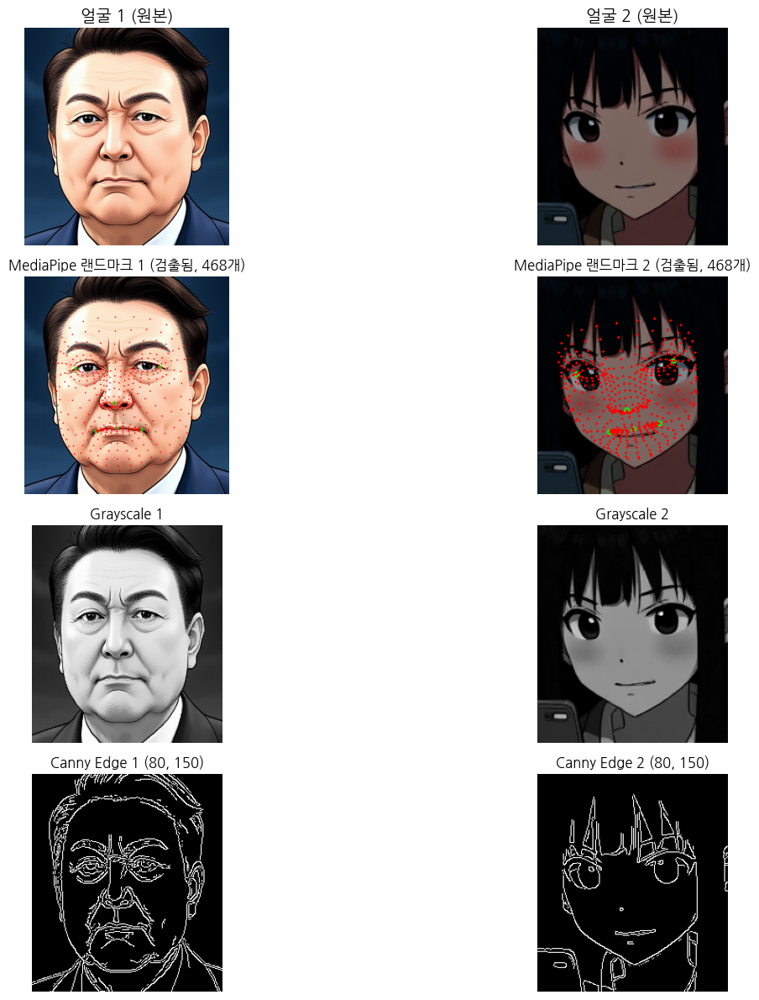


📊 ERS-SSIM 구성 요소:
1️⃣  Existence (E):
    - Face 1: 검출됨 (468 랜드마크)
    - Face 2: 검출됨 (468 랜드마크)

2️⃣  Relative Geometry (R):
    - 눈-코 비율 비교
    - 코-입 비율 비교

3️⃣  Structural (S):
    - Canny Edge SSIM

최종 점수 = E × R × S


In [59]:
# ============================================================
# 🔍 ERS-SSIM 검출 시각화
# ============================================================

if len(face_images) == 2:
    face1, face2 = face_images[0], face_images[1]
    
    # MediaPipe 랜드마크 검출
    landmarks1 = detect_landmarks(face1)
    landmarks2 = detect_landmarks(face2)
    
    # Grayscale 변환
    g1 = cv2.cvtColor(face1, cv2.COLOR_RGB2GRAY)
    g2 = cv2.cvtColor(face2, cv2.COLOR_RGB2GRAY)
    
    # 크기 맞추기
    h = min(g1.shape[0], g2.shape[0])
    w = min(g1.shape[1], g2.shape[1])
    g1_resized = cv2.resize(g1, (w, h))
    g2_resized = cv2.resize(g2, (w, h))
    
    # Canny Edge 검출
    edge1 = cv2.Canny(g1_resized, 80, 150)
    edge2 = cv2.Canny(g2_resized, 80, 150)
    
    # 랜드마크 오버레이 이미지 생성
    def draw_landmarks_on_face(face, landmarks):
        """얼굴에 랜드마크 그리기"""
        img = face.copy()
        if landmarks is None:
            return img
        
        # 주요 랜드마크만 표시 (눈, 코, 입)
        key_indices = [33, 263, 1, 13, 61, 291]  # 왼쪽 눈, 오른쪽 눈, 코, 입
        
        for idx in key_indices:
            if idx < len(landmarks):
                x, y = landmarks[idx]
                cv2.circle(img, (x, y), 3, (0, 255, 0), -1)
        
        # 모든 랜드마크를 작은 점으로 표시
        for x, y in landmarks:
            cv2.circle(img, (x, y), 1, (255, 0, 0), -1)
        
        return img
    
    face1_with_landmarks = draw_landmarks_on_face(face1, landmarks1)
    face2_with_landmarks = draw_landmarks_on_face(face2, landmarks2)
    
    # 시각화
    fig = plt.figure(figsize=(16, 12))
    
    # Row 1: 원본 얼굴
    ax1 = plt.subplot(4, 2, 1)
    ax1.imshow(face1)
    ax1.set_title('얼굴 1 (원본)', fontsize=14, fontweight='bold')
    ax1.axis('off')
    
    ax2 = plt.subplot(4, 2, 2)
    ax2.imshow(face2)
    ax2.set_title('얼굴 2 (원본)', fontsize=14, fontweight='bold')
    ax2.axis('off')
    
    # Row 2: MediaPipe 랜드마크
    ax3 = plt.subplot(4, 2, 3)
    ax3.imshow(face1_with_landmarks)
    status1 = '검출됨' if landmarks1 is not None else '미검출'
    count1 = len(landmarks1) if landmarks1 is not None else 0
    ax3.set_title(f'MediaPipe 랜드마크 1 ({status1}, {count1}개)', fontsize=12)
    ax3.axis('off')
    
    ax4 = plt.subplot(4, 2, 4)
    ax4.imshow(face2_with_landmarks)
    status2 = '검출됨' if landmarks2 is not None else '미검출'
    count2 = len(landmarks2) if landmarks2 is not None else 0
    ax4.set_title(f'MediaPipe 랜드마크 2 ({status2}, {count2}개)', fontsize=12)
    ax4.axis('off')
    
    # Row 3: Grayscale
    ax5 = plt.subplot(4, 2, 5)
    ax5.imshow(g1_resized, cmap='gray')
    ax5.set_title('Grayscale 1', fontsize=12)
    ax5.axis('off')
    
    ax6 = plt.subplot(4, 2, 6)
    ax6.imshow(g2_resized, cmap='gray')
    ax6.set_title('Grayscale 2', fontsize=12)
    ax6.axis('off')
    
    # Row 4: Canny Edge
    ax7 = plt.subplot(4, 2, 7)
    ax7.imshow(edge1, cmap='gray')
    ax7.set_title('Canny Edge 1 (80, 150)', fontsize=12)
    ax7.axis('off')
    
    ax8 = plt.subplot(4, 2, 8)
    ax8.imshow(edge2, cmap='gray')
    ax8.set_title('Canny Edge 2 (80, 150)', fontsize=12)
    ax8.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print("\n" + "=" * 60)
    print("📊 ERS-SSIM 구성 요소:")
    print("=" * 60)
    print(f"1️⃣  Existence (E):")
    print(f"    - Face 1: {status1} ({count1} 랜드마크)")
    print(f"    - Face 2: {status2} ({count2} 랜드마크)")
    print(f"\n2️⃣  Relative Geometry (R):")
    print(f"    - 눈-코 비율 비교")
    print(f"    - 코-입 비율 비교")
    print(f"\n3️⃣  Structural (S):")
    print(f"    - Canny Edge SSIM")
    print(f"\n최종 점수 = E × R × S")
    print("=" * 60)
else:
    print("먼저 Cell 2에서 두 이미지를 처리해주세요!")

🔍 MediaPipe 랜드마크 검출 분석

📊 1. 이미지 기본 속성:
----------------------------------------------------------------------

Face 1:
  크기:        377x400px
  밝기 평균:   120.9
  밝기 표준편차: 86.0
  명암 범위:   0 ~ 255 (대비: 255)
  선명도:      2159.7 (높을수록 선명)

Face 2:
  크기:        201x230px
  밝기 평균:   37.9
  밝기 표준편차: 43.7
  명암 범위:   0 ~ 188 (대비: 188)
  선명도:      324.0 (높을수록 선명)

----------------------------------------------------------------------
📊 2. MediaPipe 전처리 과정:
----------------------------------------------------------------------

Face 1:
  원본 크기: 377x400
  리사이즈: 512x543
  MediaPipe 검출 결과:
    - confidence 0.5: ✓ 검출됨
    - confidence 0.3: ✓ 검출됨
    - confidence 0.1: ✓ 검출됨

Face 2:
  원본 크기: 201x230
  리사이즈: 512x585
  MediaPipe 검출 결과:
    - confidence 0.5: ✓ 검출됨
    - confidence 0.3: ✗ 미검출
    - confidence 0.1: ✓ 검출됨


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_19764\762647015.py:156: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) NanumGothic.
  plt.tight_layout()
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_19764\762647015.py:156: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) NanumGothic.
  plt.tight_layout()


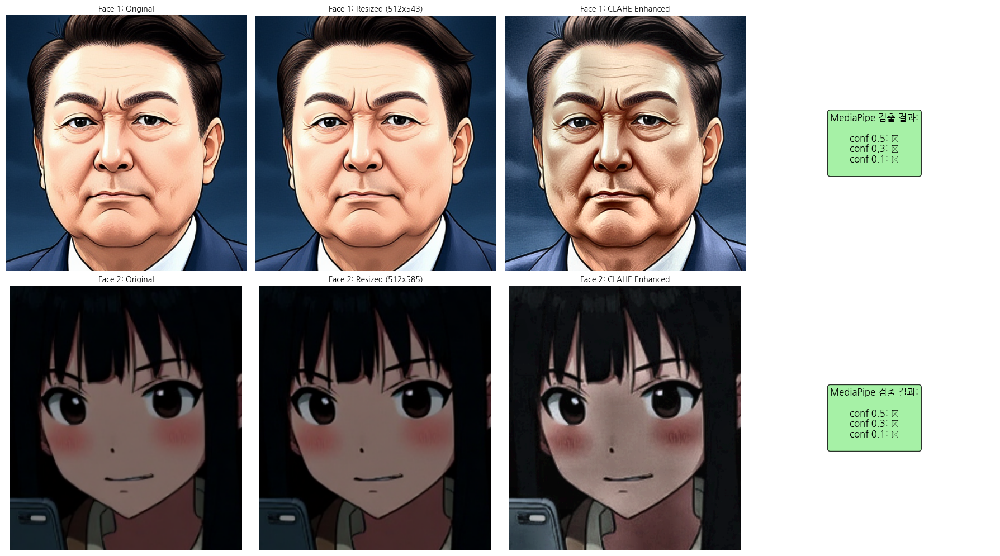


📌 분석 결론:

두 이미지 차이:
  밝기 차이:    83.0
  대비 차이:    Face1=255, Face2=188
  선명도 차이:  Face1=2159.7, Face2=324.0

검출 실패 가능 원인:
  ⚠️  매우 어두운 이미지 (평균 밝기 < 50)

💡 권장 해결 방법:
  ✓ 두 이미지 모두 검출 가능합니다!


In [60]:
# ============================================================
# 🔍 MediaPipe 랜드마크 검출 실패 원인 분석
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp

if len(face_images) == 2:
    face1, face2 = face_images[0], face_images[1]
    
    print("=" * 70)
    print("🔍 MediaPipe 랜드마크 검출 분석")
    print("=" * 70)
    
    # ====== 1. 이미지 속성 비교 ======
    print("\n📊 1. 이미지 기본 속성:")
    print("-" * 70)
    
    for idx, face in enumerate([face1, face2], 1):
        h, w = face.shape[:2]
        gray = cv2.cvtColor(face, cv2.COLOR_RGB2GRAY)
        
        # 통계 계산
        mean_brightness = np.mean(gray)
        std_brightness = np.std(gray)
        min_val = np.min(gray)
        max_val = np.max(gray)
        contrast = max_val - min_val
        
        # 선명도 (라플라시안 분산)
        laplacian = cv2.Laplacian(gray, cv2.CV_64F)
        sharpness = laplacian.var()
        
        print(f"\nFace {idx}:")
        print(f"  크기:        {w}x{h}px")
        print(f"  밝기 평균:   {mean_brightness:.1f}")
        print(f"  밝기 표준편차: {std_brightness:.1f}")
        print(f"  명암 범위:   {min_val} ~ {max_val} (대비: {contrast})")
        print(f"  선명도:      {sharpness:.1f} (높을수록 선명)")
    
    # ====== 2. MediaPipe 전처리 과정 시각화 ======
    print("\n" + "-" * 70)
    print("📊 2. MediaPipe 전처리 과정:")
    print("-" * 70)
    
    mp_face_mesh_debug = mp.solutions.face_mesh
    
    def analyze_detection_pipeline(face_rgb, face_name):
        """MediaPipe 검출 파이프라인 단계별 분석"""
        results = []
        
        # Step 1: Original
        results.append(("Original", face_rgb.copy()))
        
        # Step 2: Resize (512px minimum)
        h, w = face_rgb.shape[:2]
        target_size = 512
        if h < target_size or w < target_size:
            scale = target_size / min(h, w)
            new_w = int(w * scale)
            new_h = int(h * scale)
            resized = cv2.resize(face_rgb, (new_w, new_h), interpolation=cv2.INTER_CUBIC)
            results.append((f"Resized ({new_w}x{new_h})", resized))
        else:
            resized = face_rgb
            results.append(("No Resize (already >512px)", resized))
        
        # Step 3: CLAHE Enhancement
        lab = cv2.cvtColor(resized, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
        l_clahe = clahe.apply(l)
        lab_clahe = cv2.merge([l_clahe, a, b])
        enhanced = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2RGB)
        results.append(("CLAHE Enhanced", enhanced))
        
        # Step 4: MediaPipe Detection (multiple confidence levels)
        confidences = [0.5, 0.3, 0.1]
        detection_results = []
        
        for conf in confidences:
            face_mesh_test = mp_face_mesh_debug.FaceMesh(
                static_image_mode=True, 
                max_num_faces=1, 
                min_detection_confidence=conf,
                min_tracking_confidence=conf
            )
            
            mp_results = face_mesh_test.process(enhanced)
            detected = mp_results.multi_face_landmarks is not None
            detection_results.append((conf, detected))
            face_mesh_test.close()
        
        print(f"\n{face_name}:")
        print(f"  원본 크기: {face_rgb.shape[1]}x{face_rgb.shape[0]}")
        print(f"  리사이즈: {resized.shape[1]}x{resized.shape[0]}")
        print(f"  MediaPipe 검출 결과:")
        for conf, detected in detection_results:
            status = "✓ 검출됨" if detected else "✗ 미검출"
            print(f"    - confidence {conf}: {status}")
        
        return results, detection_results
    
    results1, det1 = analyze_detection_pipeline(face1, "Face 1")
    results2, det2 = analyze_detection_pipeline(face2, "Face 2")
    
    # ====== 3. 시각화 ======
    fig = plt.figure(figsize=(18, 10))
    
    # Face 1 pipeline
    for i, (title, img) in enumerate(results1[:3], 1):
        ax = plt.subplot(2, 4, i)
        ax.imshow(img)
        ax.set_title(f'Face 1: {title}', fontsize=10)
        ax.axis('off')
    
    # Face 1 detection status
    ax = plt.subplot(2, 4, 4)
    det_text = "MediaPipe 검출 결과:\n\n"
    for conf, detected in det1:
        status = "✓" if detected else "✗"
        det_text += f"conf {conf}: {status}\n"
    
    ax.text(0.5, 0.5, det_text, ha='center', va='center', fontsize=12,
            bbox=dict(boxstyle='round', 
                     facecolor='lightgreen' if det1[-1][1] else 'lightcoral',
                     alpha=0.8))
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.axis('off')
    
    # Face 2 pipeline
    for i, (title, img) in enumerate(results2[:3], 1):
        ax = plt.subplot(2, 4, i + 4)
        ax.imshow(img)
        ax.set_title(f'Face 2: {title}', fontsize=10)
        ax.axis('off')
    
    # Face 2 detection status
    ax = plt.subplot(2, 4, 8)
    det_text = "MediaPipe 검출 결과:\n\n"
    for conf, detected in det2:
        status = "✓" if detected else "✗"
        det_text += f"conf {conf}: {status}\n"
    
    ax.text(0.5, 0.5, det_text, ha='center', va='center', fontsize=12,
            bbox=dict(boxstyle='round', 
                     facecolor='lightgreen' if det2[-1][1] else 'lightcoral',
                     alpha=0.8))
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # ====== 4. 결론 ======
    print("\n" + "=" * 70)
    print("📌 분석 결론:")
    print("=" * 70)
    
    # 두 얼굴 비교
    gray1 = cv2.cvtColor(face1, cv2.COLOR_RGB2GRAY)
    gray2 = cv2.cvtColor(face2, cv2.COLOR_RGB2GRAY)
    
    brightness_diff = abs(np.mean(gray1) - np.mean(gray2))
    contrast1 = np.max(gray1) - np.min(gray1)
    contrast2 = np.max(gray2) - np.min(gray2)
    
    laplacian1 = cv2.Laplacian(gray1, cv2.CV_64F).var()
    laplacian2 = cv2.Laplacian(gray2, cv2.CV_64F).var()
    
    print(f"\n두 이미지 차이:")
    print(f"  밝기 차이:    {brightness_diff:.1f}")
    print(f"  대비 차이:    Face1={contrast1}, Face2={contrast2}")
    print(f"  선명도 차이:  Face1={laplacian1:.1f}, Face2={laplacian2:.1f}")
    
    print(f"\n검출 실패 가능 원인:")
    reasons = []
    
    if face1.shape[0] < 200 or face1.shape[1] < 200 or face2.shape[0] < 200 or face2.shape[1] < 200:
        reasons.append("⚠️  너무 작은 이미지 크기 (200px 미만)")
    
    if np.mean(gray1) < 50 or np.mean(gray2) < 50:
        reasons.append("⚠️  매우 어두운 이미지 (평균 밝기 < 50)")
    
    if np.mean(gray1) > 200 or np.mean(gray2) > 200:
        reasons.append("⚠️  매우 밝은 이미지 (평균 밝기 > 200)")
    
    if contrast1 < 50 or contrast2 < 50:
        reasons.append("⚠️  낮은 대비 (대비 < 50)")
    
    if laplacian1 < 100 or laplacian2 < 100:
        reasons.append("⚠️  흐릿한 이미지 (선명도 < 100)")
    
    # MediaPipe specific
    face1_detected = det1[-1][1]
    face2_detected = det2[-1][1]
    
    if not face1_detected or not face2_detected:
        reasons.append("⚠️  MediaPipe가 애니메이션 얼굴을 실제 얼굴로 인식하지 못함")
        reasons.append("   → MediaPipe는 실제 사람 얼굴용으로 학습됨")
        reasons.append("   → 애니메이션 스타일 (큰 눈, 작은 코 등)은 검출 실패 가능")
    
    if len(reasons) > 0:
        for reason in reasons:
            print(f"  {reason}")
    else:
        print("  ✓ 특별한 문제 발견되지 않음")
    
    print("\n💡 권장 해결 방법:")
    if not face1_detected or not face2_detected:
        print("  1. Cell 5 (Fallback 메커니즘) 사용")
        print("  2. Structural Term만으로 유사도 계산")
        print("  3. MediaPipe 대신 애니메이션 특화 랜드마크 검출기 사용 고려")
    else:
        print("  ✓ 두 이미지 모두 검출 가능합니다!")
    
    print("=" * 70)

else:
    print("먼저 Cell 2에서 두 이미지를 처리해주세요!")

In [ ]:
# ============================================================
# 🔄 모든 이미지 조합 비교 (자기 자신 포함)
# ============================================================

import pandas as pd

file_list = [
    'images/image1.png',
    'images/11.png',
    'images/12.png',
    'images/13.png',
    'images/14.png',
    'images/15.png',
    'images/16.png',
    'images/17.png'
]

# 결과 저장용
results = []

# 총 비교 횟수 계산 (자기 자신 포함)
total_comparisons = len(file_list) * (len(file_list) + 1) // 2

print("=" * 80)
print("🔄 모든 이미지 조합 ERS-SSIM 비교 (자기 자신 포함)")
print("=" * 80)
print(f"이미지 수: {len(file_list)}")
print(f"총 비교 횟수: {total_comparisons}")
print(f"Margin: 0% (얼굴만 타이트하게 크롭)")
print("=" * 80)

# 모든 조합 비교 (자기 자신 포함)
comparison_count = 0
for i in range(len(file_list)):
    for j in range(i, len(file_list)):  # i+1 → i로 변경 (자기 자신 포함)
        comparison_count += 1
        
        img1 = file_list[i]
        img2 = file_list[j]
        
        print(f"\n[{comparison_count}/{total_comparisons}] 비교: {img1.split('/')[-1]} vs {img2.split('/')[-1]}")
        print("-" * 80)
        
        # 이미지 처리 (margin 0% = 배경 제외)
        success = process_images(img1, img2, margin_percent=0.0)
        
        if success and len(face_images) == 2:
            # ERS-SSIM 계산 (출력 최소화)
            landmarks1 = detect_landmarks(face_images[0])
            landmarks2 = detect_landmarks(face_images[1])
            
            l, E1, E2 = existence_term(landmarks1, landmarks2)
            c, R, diff = relative_geometry_term(landmarks1, landmarks2)
            s, S, edge1, edge2, mask1, mask2 = structural_term(
                face_images[0], face_images[1], landmarks1, landmarks2
            )
            
            final_score = l * c * s
            
            print(f"✓ ERS-SSIM: {final_score:.4f} (E:{l:.2f}, R:{c:.2f}, S:{s:.2f})")
            
            # 결과 저장
            results.append({
                '이미지1': img1.split('/')[-1],
                '이미지2': img2.split('/')[-1],
                'ERS-SSIM': final_score,
                'E': l,
                'R': c,
                'S': s,
                '검출': f"{'✓' if E1 > 0 else '✗'}/{'✓' if E2 > 0 else '✗'}"
            })
        else:
            print(f"✗ 얼굴 검출 실패")
            results.append({
                '이미지1': img1.split('/')[-1],
                '이미지2': img2.split('/')[-1],
                'ERS-SSIM': 0.0,
                'E': 0.0,
                'R': 0.0,
                'S': 0.0,
                '검출': '✗/✗'
            })

# 결과 테이블 출력
print("\n" + "=" * 80)
print("📊 전체 비교 결과 요약")
print("=" * 80)

df = pd.DataFrame(results)
print(df.to_string(index=False))

# 자기 자신과의 비교 결과
print("\n" + "=" * 80)
print("🔍 자기 자신과의 비교 (기준점)")
print("=" * 80)
df_self = df[df['이미지1'] == df['이미지2']]
print(df_self.to_string(index=False))

# 순위 출력 (자기 자신 제외)
print("\n" + "=" * 80)
print("🏆 유사도 순위 TOP 10 (자기 자신 제외)")
print("=" * 80)

df_others = df[df['이미지1'] != df['이미지2']]
df_sorted = df_others.sort_values('ERS-SSIM', ascending=False)

for rank, (idx, row) in enumerate(df_sorted.head(10).iterrows(), 1):
    img1 = row['이미지1']
    img2 = row['이미지2']
    score = row['ERS-SSIM']
    
    if score > 0.90:
        emoji = "⚡"
    elif score > 0.75:
        emoji = "✅"
    elif score > 0.60:
        emoji = "🙂"
    elif score > 0.40:
        emoji = "😐"
    else:
        emoji = "❌"
    
    print(f"{rank}. {emoji} {img1} vs {img2}: {score:.4f}")

print("=" * 80)

# 특정 이미지가 포함된 비교만 필터링
print("\n💡 팁: 특정 이미지 필터링하려면:")
print("  df_filtered = df[(df['이미지1'] == 'image1.png') | (df['이미지2'] == 'image1.png')]")
print("  print(df_filtered.to_string(index=False))")
print("=" * 80)

In [ ]:
# ============================================================
# 🔍 13.png vs 15.png 상세 분석 (Margin 0%)
# ============================================================

import matplotlib.pyplot as plt
import cv2
import numpy as np

# 13.png와 15.png 비교 (margin 0% = 배경 제외)
process_images('images/13.png', 'images/15.png', margin_percent=0.0)

if len(face_images) == 2:
    # 추출된 얼굴 확인
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    axes[0].imshow(face_images[0])
    axes[0].set_title(f'13.png 추출 얼굴\n크기: {face_images[0].shape[1]}x{face_images[0].shape[0]}', fontsize=14)
    axes[0].axis('off')
    
    axes[1].imshow(face_images[1])
    axes[1].set_title(f'15.png 추출 얼굴\n크기: {face_images[1].shape[1]}x{face_images[1].shape[0]}', fontsize=14)
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # ERS-SSIM 계산
    final_score, l, c, s, E1, E2, edge1, edge2, mask1, mask2 = ers_ssim(face_images[0], face_images[1])
    
    # Edge 비교
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Row 1: Grayscale
    g1 = cv2.cvtColor(face_images[0], cv2.COLOR_RGB2GRAY)
    g2 = cv2.cvtColor(face_images[1], cv2.COLOR_RGB2GRAY)
    
    axes[0, 0].imshow(g1, cmap='gray')
    axes[0, 0].set_title('13.png Grayscale', fontsize=12)
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(g2, cmap='gray')
    axes[0, 1].set_title('15.png Grayscale', fontsize=12)
    axes[0, 1].axis('off')
    
    color = 'lightgreen' if s > 0.6 else 'lightyellow' if s > 0.4 else 'lightcoral'
    axes[0, 2].text(0.5, 0.5,
                    f"Structural Term\n\n"
                    f"S: {s:.4f}\n\n"
                    f"{'✅ 개선됨!' if s > 0.5 else '⚠️ 여전히 낮음'}",
                    ha='center', va='center', fontsize=14,
                    bbox=dict(boxstyle='round', facecolor=color, alpha=0.8))
    axes[0, 2].set_xlim(0, 1)
    axes[0, 2].set_ylim(0, 1)
    axes[0, 2].axis('off')
    
    # Row 2: Edge
    axes[1, 0].imshow(edge1, cmap='gray')
    axes[1, 0].set_title('13.png Face Feature Edge', fontsize=12)
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(edge2, cmap='gray')
    axes[1, 1].set_title('15.png Face Feature Edge', fontsize=12)
    axes[1, 1].axis('off')
    
    # Edge 차이 계산
    h = min(edge1.shape[0], edge2.shape[0])
    w = min(edge1.shape[1], edge2.shape[1])
    edge1_resized = cv2.resize(edge1, (w, h))
    edge2_resized = cv2.resize(edge2, (w, h))
    edge_diff = cv2.absdiff(edge1_resized, edge2_resized)
    
    axes[1, 2].imshow(edge_diff, cmap='hot')
    axes[1, 2].set_title('Edge 차이 (밝을수록 다름)', fontsize=12)
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print("\n" + "=" * 80)
    print("📊 분석 결과 (Margin 0% 적용 후):")
    print("=" * 80)
    print(f"최종 ERS-SSIM: {final_score:.4f}")
    print(f"  - Existence (E): {l:.4f}")
    print(f"  - Relative (R):  {c:.4f}")
    print(f"  - Structural (S): {s:.4f}")
    
    if s > 0.6:
        print(f"\n✅ Structural Term 개선!")
        print(f"   Margin 0%로 배경을 제거하여 Edge SSIM이 향상되었습니다.")
    elif s > 0.4:
        print(f"\n⚠️  Structural Term이 여전히 낮음")
        print(f"   가능한 원인:")
        print(f"   - 각도/표정/조명 차이")
        print(f"   - 15.png에서 다른 얼굴 선택")
    else:
        print(f"\n❌ Structural Term 여전히 매우 낮음")
        print(f"   15.png에 얼굴이 2개 있는데 잘못된 얼굴을 선택했을 가능성")
    
    print("=" * 80)


비교 1: images/11.png vs images/12.png
이미지 처리 시작 (YOLOv8 Anime Face Detector)

이미지 1 처리 시작: images/11.png
이미지 1 YOLOv8 얼굴 검출 중...
✓ 이미지 1 얼굴 검출 완료 (총 1개 검출)
  - 선택된 얼굴 위치: (232, 71)
  - 크기: 242x295
  - 신뢰도: 0.889

이미지 2 처리 시작: images/12.png
이미지 2 YOLOv8 얼굴 검출 중...
✓ 이미지 2 얼굴 검출 완료 (총 1개 검출)
  - 선택된 얼굴 위치: (218, 49)
  - 크기: 247x325
  - 신뢰도: 0.863

✓ 두 이미지에서 얼굴을 성공적으로 추출했습니다!


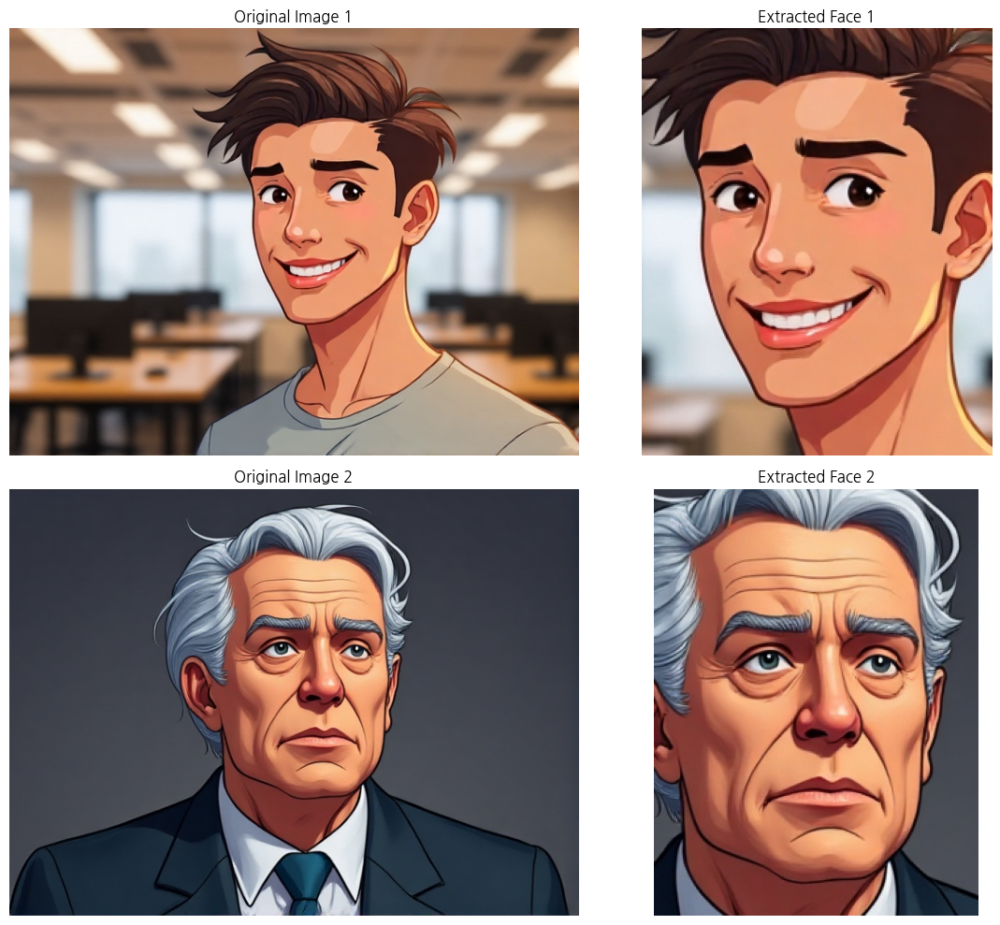


비교 2: images/11.png vs images/13.png
이미지 처리 시작 (YOLOv8 Anime Face Detector)

이미지 1 처리 시작: images/11.png
이미지 1 YOLOv8 얼굴 검출 중...
✓ 이미지 1 얼굴 검출 완료 (총 1개 검출)
  - 선택된 얼굴 위치: (232, 71)
  - 크기: 242x295
  - 신뢰도: 0.889

이미지 2 처리 시작: images/13.png
이미지 2 YOLOv8 얼굴 검출 중...
✓ 이미지 2 얼굴 검출 완료 (총 1개 검출)
  - 선택된 얼굴 위치: (245, 65)
  - 크기: 183x232
  - 신뢰도: 0.775

✓ 두 이미지에서 얼굴을 성공적으로 추출했습니다!


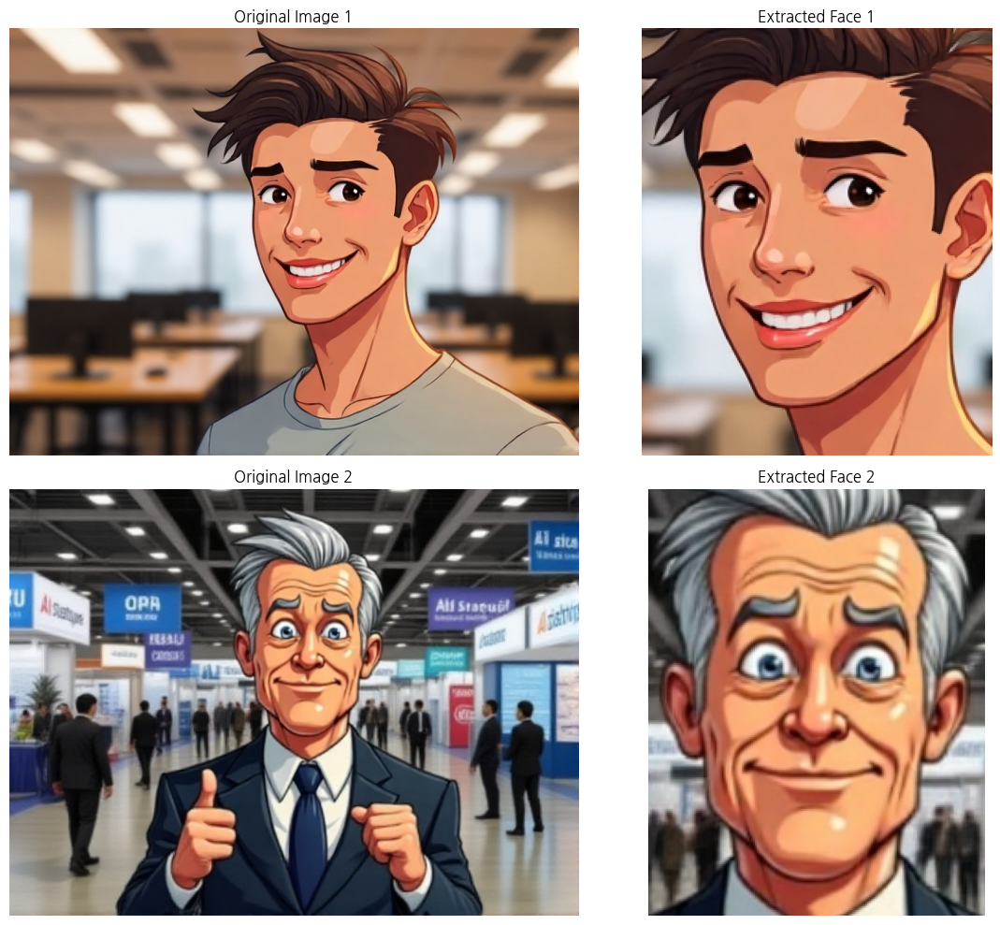


비교 3: images/11.png vs images/14.png
이미지 처리 시작 (YOLOv8 Anime Face Detector)

이미지 1 처리 시작: images/11.png
이미지 1 YOLOv8 얼굴 검출 중...
✓ 이미지 1 얼굴 검출 완료 (총 1개 검출)
  - 선택된 얼굴 위치: (232, 71)
  - 크기: 242x295
  - 신뢰도: 0.889

이미지 2 처리 시작: images/14.png
이미지 2 YOLOv8 얼굴 검출 중...
✓ 이미지 2 얼굴 검출 완료 (총 1개 검출)
  - 선택된 얼굴 위치: (240, 58)
  - 크기: 139x193
  - 신뢰도: 0.834

✓ 두 이미지에서 얼굴을 성공적으로 추출했습니다!


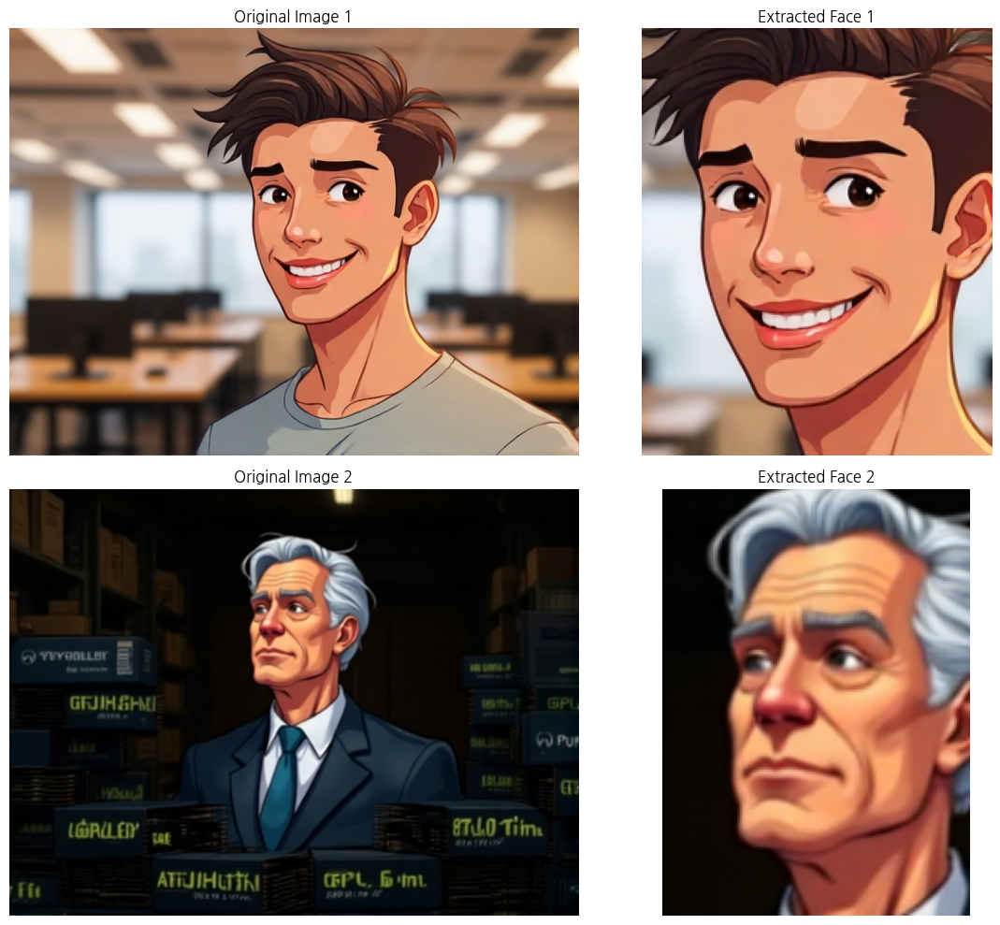


비교 4: images/11.png vs images/15.png
이미지 처리 시작 (YOLOv8 Anime Face Detector)

이미지 1 처리 시작: images/11.png
이미지 1 YOLOv8 얼굴 검출 중...
✓ 이미지 1 얼굴 검출 완료 (총 1개 검출)
  - 선택된 얼굴 위치: (232, 71)
  - 크기: 242x295
  - 신뢰도: 0.889

이미지 2 처리 시작: images/15.png
이미지 2 YOLOv8 얼굴 검출 중...
✓ 이미지 2 얼굴 검출 완료 (총 2개 검출)
  - 선택된 얼굴 위치: (426, 76)
  - 크기: 122x168
  - 신뢰도: 0.870

✓ 두 이미지에서 얼굴을 성공적으로 추출했습니다!


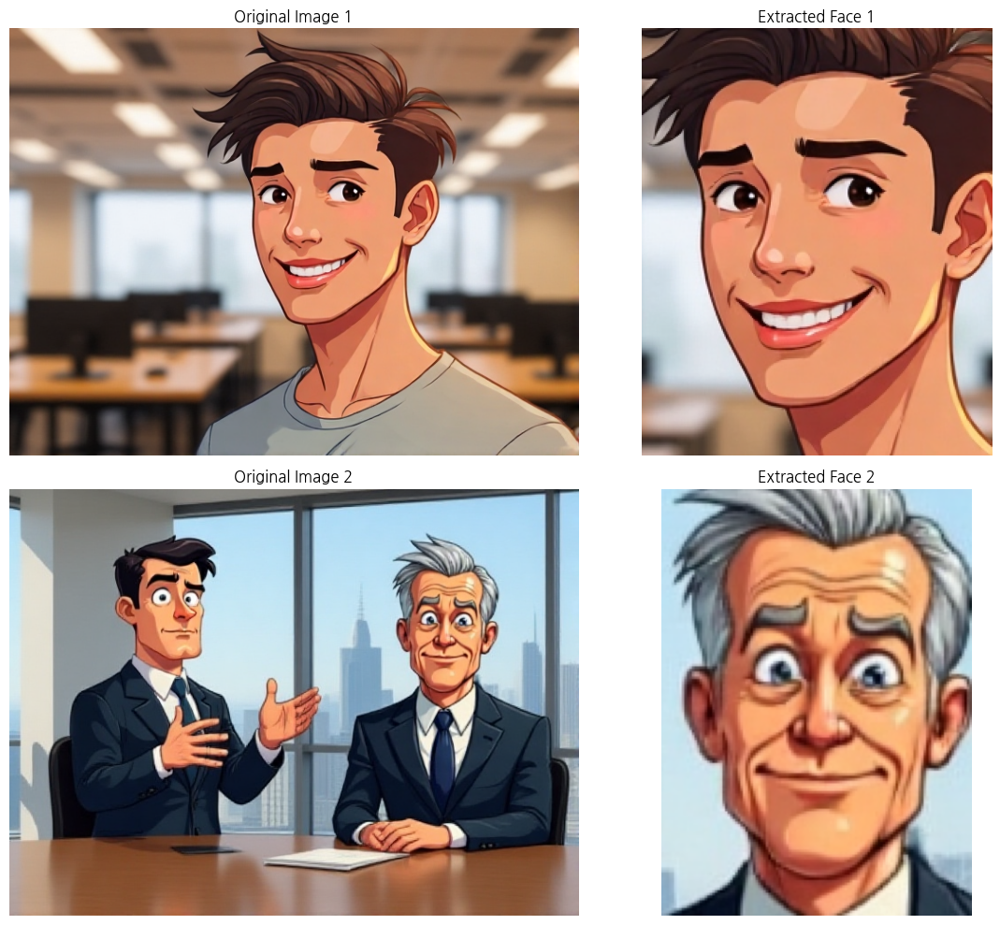


비교 5: images/11.png vs images/16.png
이미지 처리 시작 (YOLOv8 Anime Face Detector)

이미지 1 처리 시작: images/11.png
이미지 1 YOLOv8 얼굴 검출 중...


KeyboardInterrupt: 

In [ ]:
file_list = [
    'images/11.png',
    'images/12.png',
    'images/13.png',
    'images/14.png',
    'images/15.png',
    'images/16.png',
    'images/17.png'
]

base_image = 'images/image1.png'  # 11.png가 기준

for i in range(1, len(file_list)):
    print(f"\n{'='*60}")
    print(f"비교 {i}: {base_image} vs {file_list[i]}")
    print('='*60)
    process_images(base_image, file_list[i])

if len(face_images) == 2:
    result = ers_ssim(face_images[0], face_images[1])
    final_score, l, c, s, E1, E2, edge1, edge2, mask1, mask2 = result

    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    
    axes[0, 0].imshow(face_images[0])
    axes[0, 0].set_title('Face 1', fontsize=14, fontweight='bold')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(face_images[1])
    axes[0, 1].set_title('Face 2', fontsize=14, fontweight='bold')
    axes[0, 1].axis('off')
    
    axes[0, 2].text(0.5, 0.5,
                    f"ERS-SSIM\n\n"
                    f"Existence (l): {l:.3f}\n"
                    f"Relative (c): {c:.3f}\n"
                    f"Structural (s): {s:.3f}\n\n"
                    f"Final: {final_score:.3f}",
                    ha='center', va='center', fontsize=16,
                    bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
    axes[0, 2].set_xlim(0, 1)
    axes[0, 2].set_ylim(0, 1)
    axes[0, 2].axis('off')
    
    axes[1, 0].imshow(mask1, cmap='gray')
    axes[1, 0].set_title('Face Feature Mask 1', fontsize=12)
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(mask2, cmap='gray')
    axes[1, 1].set_title('Face Feature Mask 2', fontsize=12)
    axes[1, 1].axis('off')
    
    axes[1, 2].text(0.5, 0.5,
                    "마스크 영역:\n\n"
                    "• 얼굴 윤곽선\n"
                    "• 눈 (좌/우)\n"
                    "• 코\n"
                    "• 입",
                    ha='center', va='center', fontsize=12,
                    bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))
    axes[1, 2].set_xlim(0, 1)
    axes[1, 2].set_ylim(0, 1)
    axes[1, 2].axis('off')
    
    axes[2, 0].imshow(edge1, cmap='gray')
    axes[2, 0].set_title('Face Feature Edge 1', fontsize=12)
    axes[2, 0].axis('off')
    
    axes[2, 1].imshow(edge2, cmap='gray')
    axes[2, 1].set_title('Face Feature Edge 2', fontsize=12)
    axes[2, 1].axis('off')
    
    edge_ssim_value = ssim(edge1, edge2, data_range=255)
    axes[2, 2].text(0.5, 0.5,
                    f"Edge SSIM\n\n"
                    f"Score: {edge_ssim_value:.4f}\n\n"
                    f"(직접 사용)",
                    ha='center', va='center', fontsize=14,
                    bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))
    axes[2, 2].set_xlim(0, 1)
    axes[2, 2].set_ylim(0, 1)
    axes[2, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

    print("\n=== ERS-SSIM 분석 결과 ===")
    print(f"Existence Term:    {l:.4f} (E1={E1:.1f}, E2={E2:.1f})")
    print(f"Relative Geometry: {c:.4f}")
    print(f"Structural Term:   {s:.4f} (Edge SSIM 직접 사용)")
    print(f"\n최종 ERS-SSIM:     {final_score:.4f}")

    if final_score > 0.90:
        print("\n⚡ 매우 유사한 얼굴입니다!")
    elif final_score > 0.75:
        print("\n✅ 같은 얼굴입니다!")
    elif final_score > 0.60:
        print("\n🙂 유사한 얼굴입니다.")
    elif final_score > 0.40:
        print("\n😐 약간 유사합니다.")
    else:
        print("\n❌ 다른 얼굴입니다.")
else:
    print("먼저 위의 블록에서 두 이미지를 업로드하고 얼굴을 추출해주세요.")
